In [1]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import hsv_to_rgb
import colorsys

class ColorGenerator:
    def __init__(self):
        # 基础颜色对 (保持原有的10个)
        self.base_colors = [
            ('#88D498', '#1A936F'),  # Green shades
            ('#64B2CD', '#3C70A4'),  # Blue shades
            ('#FFB347', '#FF8C00'),  # Orange shades
            ('#C490D1', '#9D65C9'),  # Purple shades
            ('#FF6B6B', '#D63230'),  # Red shades
            ('#FFEE93', '#FCBF49'),  # Yellow shades
            ('#A0C4FF', '#4361EE'),  # Light blue shades
            ('#D8BBD8', '#9D4EDD'),  # Lavender shades
            ('#9BC995', '#2D6A4F'),  # Mint shades
            ('#FFD6A5', '#FB8500')   # Peach shades
        ]
    
    def generate_colors(self, num_cities: int):
        """
        生成足够数量的颜色对
        
        Args:
            num_cities: 需要的城市数量
            
        Returns:
            List of color tuples (light_color, dark_color)
        """
        if num_cities <= len(self.base_colors):
            return self.base_colors[:num_cities]
        
        # 如果需要更多颜色，使用HSV颜色空间生成
        colors = self.base_colors.copy()
        
        # 计算还需要多少颜色
        additional_needed = num_cities - len(self.base_colors)
        
        # 生成额外的颜色
        for i in range(additional_needed):
            # 使用HSV颜色空间，在色相上均匀分布
            hue = (i * 360 / additional_needed) % 360
            
            # 生成两个饱和度/明度不同的颜色
            light_color = self._hsv_to_hex(hue, 0.6, 0.9)  # 较浅的颜色
            dark_color = self._hsv_to_hex(hue, 0.8, 0.6)   # 较深的颜色
            
            colors.append((light_color, dark_color))
        
        return colors
    
    def _hsv_to_hex(self, h, s, v):
        """将HSV颜色转换为十六进制"""
        rgb = colorsys.hsv_to_rgb(h/360, s, v)
        return '#{:02x}{:02x}{:02x}'.format(
            int(rgb[0] * 255),
            int(rgb[1] * 255),
            int(rgb[2] * 255)
        )

In [2]:
# import pandas as pd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import math
import os
from scipy.optimize import curve_fit
from typing import Dict, List, Tuple, Optional
import matplotlib.ticker as ticker
from scipy.integrate import quad

class UrbanFormAnalyzer:
    def __init__(self, data_folder: str = "pixel_data"):
        """
        Initialize the Urban Form Analyzer.
        Args:
            data_folder: Path to the folder containing the pixel data CSV files
        """
        self.data_folder = data_folder
        self.samples_folder = "samples"  # 新增
        # Ensure output directory exists
        os.makedirs("visualizations", exist_ok=True)
        os.makedirs(self.samples_folder, exist_ok=True)  # 新增
        
        # Initialize dictionaries to store results
        self.datasets = {}
        self.city_data = {}  # Stores city population and years
        self.area_params = {}
        self.height_params = {}
        self.color_map = {}
        self.pixel_area = 100 
        self.color_generator = ColorGenerator()
        
        # Default color palette - will expand as needed
        self.base_colors = [
            ('#88D498', '#1A936F'),  # Green shades
            ('#64B2CD', '#3C70A4'),  # Blue shades
            ('#FFB347', '#FF8C00'),  # Orange shades
            ('#C490D1', '#9D65C9'),  # Purple shades
            ('#FF6B6B', '#D63230'),  # Red shades
            ('#FFEE93', '#FCBF49'),  # Yellow shades
            ('#A0C4FF', '#4361EE'),  # Light blue shades
            ('#D8BBD8', '#9D4EDD'),  # Lavender shades
            ('#9BC995', '#2D6A4F'),  # Mint shades
            ('#FFD6A5', '#FB8500')   # Peach shades
        ]
    
    def add_city(self, city_name: str, years: List[str], populations: Dict[str, int]) -> None:
        """
        Add a city to the analysis.
        
        Args:
            city_name: Name of the city
            years: List of years to analyze (e.g., ["2016", "2023"])
            populations: Dictionary mapping years to populations
        """
        if city_name not in self.city_data:
            self.city_data[city_name] = {"years": years, "populations": populations}
            
            # Load datasets
            for year in years:
                dataset_key = f"{city_name} {year}"
                file_path = os.path.join(self.data_folder, f"{city_name}_{year}_all_pixels_data.csv")
                self.datasets[dataset_key] = file_path
    
    def create_samples(self) -> None:
        """
        Create sample datasets for all cities and years.
        This should be run once to generate smaller datasets for model fitting.
        """
        for city_name, data in self.city_data.items():
            years = data["years"]
            populations = data["populations"]
            
            for year in years:
                dataset_key = f"{city_name} {year}"
                original_file = self.datasets[dataset_key]
                sample_file = os.path.join(self.samples_folder, f"{city_name}_{year}_sample.csv")
                
                # Skip if sample already exists
                if os.path.exists(sample_file):
                    print(f"Sample already exists for {dataset_key}")
                    continue
                
                # Load original data
                df = pd.read_csv(original_file)
                population = populations[year]
                
                # Create samples for urban cover model (100k samples)
                df_urban_sample = df.sample(n=min(100000, len(df)), random_state=72)
                
                # Create samples for height model (10k building samples)
                df_building = df[df['building_exist'] == 1]
                df_height_sample = df_building.sample(n=min(10000, len(df_building)), random_state=72)
                
                # Calculate remoteness for both samples
                df_urban_sample['remoteness_to_center'] = df_urban_sample['distance_to_center'] / math.sqrt(population) * 1000
                df_height_sample['remoteness_to_center'] = df_height_sample['distance_to_center'] / math.sqrt(population) * 1000
                
                # Save urban cover sample
                urban_sample_file = os.path.join(self.samples_folder, f"{city_name}_{year}_urban_sample.csv")
                df_urban_sample[['remoteness_to_center', 'building_exist']].to_csv(urban_sample_file, index=False)
                
                # Save height sample
                height_sample_file = os.path.join(self.samples_folder, f"{city_name}_{year}_height_sample.csv")
                df_height_sample[['remoteness_to_center', 'building_height']].to_csv(height_sample_file, index=False)
                
                print(f"Created samples for {dataset_key}")
    
    def prepare_data(self) -> None:
        """Load and analyze all datasets, calculating model parameters for all cities."""
        
        # 根据城市数量生成足够的颜色
        num_cities = len(self.city_data)
        colors = self.color_generator.generate_colors(num_cities)
        
        # 为每个城市分配颜色
        for i, city_name in enumerate(self.city_data.keys()):
            self.color_map[city_name] = colors[i]
 
        # Results containers
        area_results = []
        height_results = []
        
        for city_name, data in self.city_data.items():
            years = data["years"]
            populations = data["populations"]
            
            city_area_params = {}
            city_height_params = {}
            
            for year in years:
                dataset_key = f"{city_name} {year}"
                population = populations[year]
                
                # Process urban cover (logistic model)
                k, d, conf, mcfadden_r2, r2_traditional = self._fit_urban_cover_model(dataset_key, population)
                area_results.append({
                    "City": city_name,
                    "Year": year,
                    "kappa": round(k, 3),
                    "95% CI kappa": f"[{conf.loc['const', '2.5%']:.3f}, {conf.loc['const', '97.5%']:.3f}]",
                    "delta": round(d, 3),
                    "95% CI delta": f"[{conf.loc['remoteness_to_center', '2.5%']:.3f}, {conf.loc['remoteness_to_center', '97.5%']:.3f}]",
                    "McFadden R2": round(mcfadden_r2, 4),
                    "Traditional R2": round(r2_traditional, 4)
                })
                city_area_params[year] = (k, d)
                
                # Process building height (exponential model)
                a, b, alpha_ci, beta_ci, r2_traditional = self._fit_building_height_model(dataset_key, population)
                height_results.append({
                    "City": city_name,
                    "Year": year,
                    "alpha": round(a, 3),
                    "95% CI alpha": f"[{alpha_ci[0]:.3f}, {alpha_ci[1]:.3f}]",
                    "beta": round(b, 3),
                    "95% CI beta": f"[{beta_ci[0]:.3f}, {beta_ci[1]:.3f}]",
                    "Traditional R2": round(r2_traditional, 4)
                })
                city_height_params[year] = (a, b)
            
            self.area_params[city_name] = city_area_params
            self.height_params[city_name] = city_height_params
        
        # Create and save parameter DataFrames
        pd.DataFrame(area_results).to_csv("area_remoteness_params.csv", index=False)
        pd.DataFrame(height_results).to_csv("height_remoteness_params.csv", index=False)
    
    def _fit_urban_cover_model(self, dataset_key: str, population: int) -> Tuple[float, float]:
        """
        Fit logistic model for urban cover using pre-generated samples.
        """
        # NEW (handles spaces in city names):
        parts = dataset_key.split(' ')
        year = parts[-1]  # Last part is always the year
        city_name = ' '.join(parts[:-1])  # Everything else is the city name

        sample_file = os.path.join(self.samples_folder, f"{city_name}_{year}_urban_sample.csv")
        
        # Load sample data
        df = pd.read_csv(sample_file)
        
        X = df[['remoteness_to_center']]
        y = df['building_exist']
        
        # Fit logistic model
        X_const = sm.add_constant(X)
        model = sm.Logit(y, X_const).fit(disp=False)
        params = model.params
        
        # Extract parameters
        kappa = params['const']
        delta = params['remoteness_to_center']
    
        # Calculate confidence intervals and R²
        conf = model.conf_int(alpha=0.05)
        conf.columns = ['2.5%', '97.5%']
        mcfadden_r2 = 1 - model.llf / model.llnull
        y_pred = model.predict(X_const)
        r2_traditional = 1 - np.sum((y - y_pred) ** 2) / np.sum((y - np.mean(y)) ** 2)
        
        return kappa, delta, conf, mcfadden_r2, r2_traditional
    
    def _fit_building_height_model(self, dataset_key: str, population: int) -> Tuple[float, float]:
        """
        Fit exponential model for building height using pre-generated samples.
        """
        # Define the exponential function
        def exp_func(x, alpha, beta):
            return alpha * np.exp(-beta * x)
    
        parts = dataset_key.split(' ')
        year = parts[-1]  # Last part is always the year
        city_name = ' '.join(parts[:-1])  # Everything else is the city name
        sample_file = os.path.join(self.samples_folder, f"{city_name}_{year}_height_sample.csv")
        
        # Load sample data
        df = pd.read_csv(sample_file)
        
        # Make sure we have enough data
        if len(df) < 100:
            print(f"Warning: Only {len(df)} building samples for {dataset_key}. Using default parameters.")
            return 5.0, 0.5, (4.0, 6.0), (0.4, 0.6), 0.5
        
        remoteness = df['remoteness_to_center'].values
        height = df['building_height'].values
        
        # Remove zeros or negative values that might cause fitting problems
        valid_idx = (height > 0) & (remoteness > 0)
        if valid_idx.sum() < 100:
            print(f"Warning: Not enough valid data points for {dataset_key}. Using default parameters.")
            return 5.0, 0.5, (4.0, 6.0), (0.4, 0.6), 0.5
            
        remoteness_clean = remoteness[valid_idx]
        height_clean = height[valid_idx]
        
        # Fit exponential model
        popt, pcov = curve_fit(
            exp_func, 
            remoteness_clean, 
            height_clean, 
            p0=(5.0, 0.5),
            bounds=([0.1, 0.01], [50, 10]),
            maxfev=2000
        )
        
        alpha, beta = popt
    
        # Calculate confidence intervals and R²
        perr = np.sqrt(np.diag(pcov))
        alpha_ci = (alpha - 1.96 * perr[0], alpha + 1.96 * perr[0])
        beta_ci = (beta - 1.96 * perr[1], beta + 1.96 * perr[1])
        y_pred = exp_func(remoteness_clean, alpha, beta)
        ss_res = np.sum((height_clean - y_pred) ** 2)
        ss_tot = np.sum((height_clean - np.mean(height_clean)) ** 2)
        r2_traditional = 1 - ss_res / ss_tot
        
        return alpha, beta, alpha_ci, beta_ci, r2_traditional
    
    def visualize_individual_cities(self, save_path: Optional[str] = None) -> None:
        """
        Create individual city visualizations for urban cover and building height.
        
        Args:
            save_path: Path to save the visualizations (None for display only)
        """
        for city_name, data in self.city_data.items():
            years = data["years"]
            populations = data["populations"]
            
            # Create figure with 2 subplots (urban cover and building height)
            fig, axes = plt.subplots(2, 2, figsize=(15, 12))
            fig.suptitle(f"{city_name} Urban Form Analysis", fontsize=16)
            
            # Plot urban cover (logistic model)
            self._plot_urban_cover(axes[0, 0], city_name, years, populations)
            
            # Plot building height (exponential model)  
            self._plot_building_height(axes[0, 1], city_name, years, populations)
            
            # Plot building volume density
            self._plot_building_volume_density(axes[1, 0], city_name, years, populations)
            
            # Plot cumulative volume
            self._plot_cumulative_volume(axes[1, 1], city_name, years, populations)
            
            plt.tight_layout()
            if save_path:
                plt.savefig(os.path.join(save_path, f"{city_name}_analysis.png"), dpi=300)
            plt.show()
    
    def _plot_urban_cover(self, ax, city_name: str, years: List[str], populations: Dict[str, int]) -> None:
        """Plot urban cover logistic curves for a city."""
        # Define the logistic function
        def logistic_func(x, k, d):
            return 1 / (1 + np.exp(-(k + d * x)))

        for i, year in enumerate(years):
            dataset_key = f"{city_name} {year}"
            population = populations[year]
            df = pd.read_csv(self.datasets[dataset_key]).sample(n=10000, random_state=72)
            remoteness = df['distance_to_center'] / math.sqrt(population) * 1000
            
            # Get parameters
            k, d = self.area_params[city_name][year]
            
            # Generate prediction line
            x_vals = np.linspace(0, 20, 500)
            y_vals = logistic_func(x_vals, k, d)
            
            # Plot prediction line
            color = self.color_map[city_name][i]
            ax.plot(x_vals, y_vals, color=color, linewidth=3, label=f"{year}")
            
            equation_text = (
                r"$\hat{y}_{" + f"{year}" + r"} = \frac{{1}}{{1 + e^{{-(" +
                f"{k:.3f} + {d:.3f}R" +
                r")}}}}$"
            )
            ax.text(0.4, 0.3 + i*0.12, equation_text, transform=ax.transAxes,
                    fontsize=16, verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
        
        ax.set_title(f"{city_name} - Urban Cover", fontsize=18) 
        ax.set_xlabel("Remoteness (R)")
        ax.set_ylabel("Probability of Building Exist (0-1)")
        ax.legend()
        ax.grid(True, alpha=0.3)
        ax.set_ylim(0, 1.05)
        ax.xaxis.set_major_locator(ticker.MultipleLocator(2))
        ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
        
    
    def _plot_building_height(self, ax, city_name: str, years: List[str], populations: Dict[str, int]) -> None:
        """Plot building height exponential curves for a city."""
        # Define the exponential function
        def exp_func(x, alpha, beta):
            return alpha * np.exp(-beta * x)
        
        max_vals = []
        
        for i, year in enumerate(years):
            dataset_key = f"{city_name} {year}"
            population = populations[year]
            
            # Load sample data for range determination
            df = pd.read_csv(self.datasets[dataset_key])
            df_filter = df[df['building_exist'] == 1]
            df_sample = df_filter.sample(n=min(10000, len(df_filter)), random_state=72)
            remoteness = df_sample['distance_to_center'] / math.sqrt(population) * 1000
            
            # Get parameters
            alpha, beta = self.height_params[city_name][year]
            
            # Generate prediction line
            x_vals = np.linspace(0, 20, 500)
            y_vals = exp_func(x_vals, alpha, beta)
            max_vals.append(np.max(y_vals))
            
            # Plot
            color = self.color_map[city_name][i]
            ax.plot(x_vals, y_vals, color=color, linewidth=3, label=f"{year}")

            equation_text = (
                r"${H}_{" + f"{year}" + r"} = " + f"{alpha:.3f}" + r" * e^{-(" + f"{beta:.3f}" + r" * R)}$"
            )
            ax.text(0.03, 0.05 + i*0.12, equation_text, transform=ax.transAxes,
                    fontsize=16, verticalalignment='top',  # 改为16
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
        
        ax.set_title(f"{city_name} - Building Height", fontsize=18)  # 增加fontsize
        ax.set_xlabel("Remoteness (R)")
        ax.set_ylabel("Building Height (m)")
        ax.legend()
        ax.grid(True, alpha=0.3)
        ax.set_xlim(0, 20)
        ax.set_ylim(0, max(max_vals) * 1.1)
        ax.xaxis.set_major_locator(ticker.MultipleLocator(2))
        ax.yaxis.set_major_locator(ticker.MultipleLocator(1))

    def _plot_building_volume_density(self, ax, city_name: str, years: List[str], populations: Dict[str, int]) -> None:
        """Plot building volume density curves for a city."""
        max_vals = []
        for i, year in enumerate(years):
            # Get parameters
            k, d = self.area_params[city_name][year]
            alpha, beta = self.height_params[city_name][year]
            
            # Generate prediction line
            x_vals = np.linspace(0, 20, 500)
            prob = 1 / (1 + np.exp(-(k + d * x_vals)))
            height = alpha * np.exp(-beta * x_vals)
            volume = self.pixel_area * prob * height
            max_vals.append(np.max(volume))
            
            # Plot
            color = self.color_map[city_name][i]
            ax.plot(x_vals, volume, color=color, linewidth=3, label=f"{year}")
            
            # Equation text
            eq_text = (
                rf"$V_{{{year}}} = {self.pixel_area:.0f} \cdot \frac{{1}}{{1 + e^{{-({k:.2f} + {d:.2f}R)}}}}"
                rf" \cdot {alpha:.2f}e^{{-{beta:.2f}R}}$"
            )
            ax.text(0.25, 0.45 + i*0.15, eq_text, transform=ax.transAxes,
                    fontsize=13, bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
        
        ax.set_title(f"{city_name} - Building Volume Density", fontsize=18)
        ax.set_xlabel("Remoteness (R)")
        ax.set_ylabel("Avg. Building Volume per Pixel (m³)")
        ax.legend()
        ax.grid(True)
        ax.set_xlim(0, 20)
        ax.set_ylim(0, max(max_vals) * 1.1)
        ax.xaxis.set_major_locator(ticker.MultipleLocator(2))
        ax.yaxis.set_major_locator(ticker.MultipleLocator(50))
    
    def _plot_cumulative_volume(self, ax, city_name: str, years: List[str], populations: Dict[str, int]) -> None:
        """Plot cumulative volume curves for a city."""
        max_vals = []
        
        for i, year in enumerate(years):
            # Get parameters
            k, d = self.area_params[city_name][year]
            alpha, beta = self.height_params[city_name][year]
            
            # Define volume density function
            def volume_density(R):
                prob = 1 / (1 + np.exp(-(k + d * R)))
                height = alpha * np.exp(-beta * R)
                return self.pixel_area * prob * height * 2 * np.pi * R
            
            # Generate cumulative values
            R_vals = np.linspace(0, 18, 500)
            cum_vals = np.zeros_like(R_vals)
            
            for idx, R in enumerate(R_vals):
                if R > 0:
                    cum_vals[idx], _ = quad(volume_density, 0, R)
            max_vals.append(np.max(cum_vals))
            
            # Plot
            color = self.color_map[city_name][i]
            ax.plot(R_vals, cum_vals, color=color, linewidth=3, label=f"{year}")
        
        ax.set_title(f"{city_name} - Cumulative Volume vs. Remoteness", fontsize=17)
        ax.set_xlabel("Remoteness (R)")
        ax.set_ylabel("Cumulative Building Volume (m³)")
        ax.set_xlim(0, 20)
        ax.set_ylim(0, max(max_vals)*1.1)
        ax.legend()
        ax.grid(True)
        # ax.xaxis.set_major_locator(ticker.MultipleLocator(2))
        # ax.yaxis.set_major_locator(ticker.MultipleLocator(2000))
    
    def visualize_combined_models(self, save_path: Optional[str] = None) -> None:
        """
        Create combined visualizations for all cities.
        
        Args:
            save_path: Path to save the visualizations (None for display only)
        """
        # Define the model functions
        def logistic_func(x, k, d):
            return 1 / (1 + np.exp(-(k + d * x)))
        
        def exp_func(x, alpha, beta):
            return alpha * np.exp(-beta * x)
        
        # Create two plots - one for urban cover, one for building height
        fig, axes = plt.subplots(2, 2, figsize=(15, 12))
        
        # Set titles
        axes[0, 0].set_title("Urban Cover", fontsize=24)
        axes[0, 1].set_title("Building Height", fontsize=24)
        axes[1, 0].set_title("Building Volume", fontsize=24)
        axes[1, 1].set_title("Cumulative Volume", fontsize=24)
        
        axes[0, 0].set_ylabel("Probability of Building Exist (0-1)",fontsize = 18)
        axes[0, 1].set_ylabel("Building Height (m)",fontsize = 18)
        axes[1, 0].set_ylabel("Building Volume (m³)",fontsize = 18)
        axes[1, 1].set_ylabel("Cumulative Volume (m³)",fontsize = 18)

        
        # Track max values for consistent axis limits
        max_height = 0
        max_volume = 0
        max_cumulative = 0
        x_range = np.linspace(0, 18, 500)
        
        # Plot each city
        for city_name, data in self.city_data.items():
            years = data["years"]
            
            for i, year in enumerate(years):
                color = self.color_map[city_name][i]
                label = f"{city_name} {year}"
                
                # Urban cover plot
                k, d = self.area_params[city_name][year]
                y_vals_uc = logistic_func(x_range, k, d)
                axes[0, 0].plot(x_range, y_vals_uc, color=color, linewidth=3.5, label=label)
                
                # Building height plot
                alpha, beta = self.height_params[city_name][year]
                y_vals_bh = exp_func(x_range, alpha, beta)
                axes[0, 1].plot(x_range, y_vals_bh, color=color, linewidth=3.5, label=label)
                
                # Update max height for y-axis limit
                current_max = np.max(y_vals_bh)
                if current_max > max_height:
                    max_height = current_max

                # Building volume density plot
                k, d = self.area_params[city_name][year]
                alpha, beta = self.height_params[city_name][year]
                prob_vals = logistic_func(x_range, k, d)
                height_vals = exp_func(x_range, alpha, beta)
                volume_vals = self.pixel_area * prob_vals * height_vals
                axes[1, 0].plot(x_range, volume_vals, color=color, linewidth=3.5, label=label)
                
                # Cumulative volume plot
                def volume_density_func(R):
                    prob = logistic_func(np.array([R]), k, d)[0]
                    height = exp_func(np.array([R]), alpha, beta)[0]
                    return self.pixel_area * prob * height * 2 * np.pi * R
                
                cum_vals = np.zeros_like(x_range)
                for idx, R in enumerate(x_range):
                    if R > 0:
                        cum_vals[idx], _ = quad(volume_density_func, 0, R)
                axes[1, 1].plot(x_range, cum_vals, color=color, linewidth=3.5, label=label)
                
                # Update max values for y-axis limits
                current_max_volume = np.max(volume_vals)
                if current_max_volume > max_volume:
                    max_volume = current_max_volume
                    
                current_max_cum = np.max(cum_vals)
                if current_max_cum > max_cumulative:
                    max_cumulative = current_max_cum

        # Set y-limits
        axes[0, 0].set_ylim(0, 1.05)
        axes[0, 1].set_ylim(0, max_height * 1.1)
        axes[1, 0].set_ylim(0, max_volume * 1.1)
        axes[1, 1].set_ylim(0, max_cumulative * 1.1)
        
        # Add others
        for ax_row in axes:
            for ax in ax_row:
                ax.set_xlabel("Remoteness (R)",fontsize = 18)
                ax.legend(loc='best', fontsize=18)
                ax.tick_params(axis='x', labelsize=12)  # 调整 x 轴刻度文字大小为 12
                ax.tick_params(axis='y', labelsize=12)  # 调整 y 轴刻度文字大小为 12
                ax.grid(True, alpha=0.3)
                ax.set_xlim(0, 20)  # Or use a calculated max_x_range
                ax.xaxis.set_major_locator(ticker.MultipleLocator(2))
        
        plt.tight_layout()
        if save_path:
            plt.savefig(os.path.join(save_path, "combined_models.png"), dpi=300)
        plt.show()
    
    def visualize_parameter_space(self, save_path: Optional[str] = None) -> None:
        """
        Create parameter space visualizations.
        
        Args:
            save_path: Path to save the visualizations (None for display only)
        """
        # Create two plots - one for k-d space, one for a-b space
        fig, axes = plt.subplots(1, 2, figsize=(15, 6))
        
        # Set titles
        axes[0].set_title("Urban Form Evolution in κ–δ Space", fontsize=14)
        axes[1].set_title("Urban Form Evolution in α–β Space", fontsize=14)
        
        # Set labels
        axes[0].set_xlabel("κ (intercept)")
        axes[0].set_ylabel("δ (slope)")
        axes[1].set_xlabel("α (scale)")
        axes[1].set_ylabel("β (decay rate)")
        
        # Add grid
        for ax in axes:
            ax.grid(True, alpha=0.3)
        
        # Plot each city's parameter evolution
        for city_name, data in self.city_data.items():
            years = sorted(data["years"])
            if len(years) < 2:
                continue  # Skip cities with only one year of data
                
            # Extract parameters
            k_start, d_start = self.area_params[city_name][years[0]]
            k_end, d_end = self.area_params[city_name][years[-1]]
            
            a_start, b_start = self.height_params[city_name][years[0]]
            a_end, b_end = self.height_params[city_name][years[-1]]
            
            # Get colors
            start_color, end_color = self.color_map[city_name]
            
            # Plot k-d space
            axes[0].annotate('', xy=(k_end, d_end), xytext=(k_start, d_start),
                            arrowprops=dict(facecolor='grey', shrink=0.05, width=1.5, headwidth=7))
            axes[0].scatter(k_start, d_start, color=start_color, label=f"{city_name} {years[0]}", marker='o', s=60)
            axes[0].scatter(k_end, d_end, color=end_color, label=f"{city_name} {years[-1]}", marker='o', s=60)
            
            # Plot a-b space
            axes[1].annotate('', xy=(a_end, b_end), xytext=(a_start, b_start),
                            arrowprops=dict(facecolor='grey', shrink=0.05, width=1.5, headwidth=7))
            axes[1].scatter(a_start, b_start, color=start_color, label=f"{city_name} {years[0]}", marker='o', s=60)
            axes[1].scatter(a_end, b_end, color=end_color, label=f"{city_name} {years[-1]}", marker='o', s=60)
            
            # Add labels to points in k-d space
            axes[0].annotate(f"{city_name} {years[0]}", 
                            (k_start, d_start), 
                            textcoords="offset points", 
                            xytext=(5, 5), 
                            fontsize=8)
            axes[0].annotate(f"{city_name} {years[-1]}", 
                            (k_end, d_end), 
                            textcoords="offset points", 
                            xytext=(5, 5), 
                            fontsize=8)
            
            # Add labels to points in a-b space
            axes[1].annotate(f"{city_name} {years[0]}", 
                            (a_start, b_start), 
                            textcoords="offset points", 
                            xytext=(5, 5), 
                            fontsize=8)
            axes[1].annotate(f"{city_name} {years[-1]}", 
                            (a_end, b_end), 
                            textcoords="offset points", 
                            xytext=(5, 5), 
                            fontsize=8)
        
        plt.tight_layout()
        if save_path:
            plt.savefig(os.path.join(save_path, "parameter_space_evolution.png"), dpi=300)
        plt.show()

def run_urban_form_analysis(
    cities_data: Dict[str, Dict[str, Dict[str, int]]],
    visualizations: List[str] = ["individual", "combined", "parameter_space"],
    data_folder: str = "pixel_data",
    save_path: str = "visualizations",
    create_samples: bool = True  # 新增参数
):
    """
    Run the urban form analysis with the specified cities and visualizations.
    
    Args:
        cities_data: Dictionary mapping city names to years and populations
        visualizations: List of visualizations to generate
        data_folder: Path to the folder containing the pixel data CSV files
        save_path: Path to save the visualizations
        create_samples: Whether to create sample datasets (run once)
    """
    # Initialize analyzer
    analyzer = UrbanFormAnalyzer(data_folder=data_folder)
    
    # Add cities
    for city_name, data in cities_data.items():
        analyzer.add_city(
            city_name=city_name, 
            years=data["years"], 
            populations=data["populations"]
        )
    
    # Create samples if requested
    if create_samples:
        analyzer.create_samples()
    
    # Prepare data and compute parameters
    analyzer.prepare_data()
    
    # Generate requested visualizations
    if "individual" in visualizations:
        analyzer.visualize_individual_cities(save_path=save_path)
    
    if "combined" in visualizations:
        analyzer.visualize_combined_models(save_path=save_path)
    
    if "parameter_space" in visualizations:
        analyzer.visualize_parameter_space(save_path=save_path)

In [ ]:
import pandas as pd

def generate_cities_data(csv_file: str = "CitiesDB_new.csv", start_index: int = 0, end_index: int = None):
    # Read the CSV file
    df = pd.read_csv(csv_file)
    
    # Apply indexing selection
    if end_index is None:
        selected_df = df.iloc[start_index:]
    else:
        selected_df = df.iloc[start_index:end_index]
    
    print(f"Selected cities (index {start_index} to {end_index if end_index else 'end'}):")
    print(f"Total cities selected: {len(selected_df)}")
    print("-" * 50)
    
    # Generate cities_data dictionary
    cities_data = {}
    
    for idx, row in selected_df.iterrows():
        city_name = row['Name']
        
        # Convert population from thousands to actual numbers
        pop_2016 = int(row['pop_16_UN'] * 1000)
        pop_2023 = int(row['pop_23_UN'] * 1000)
        
        cities_data[city_name] = {
            "years": ["2016", "2023"],
            "populations": {
                "2016": pop_2016,
                "2023": pop_2023
            }
        }
        
        print(f"{city_name}:")
        print(f"  Country: {row['Country']}")
        print(f"  Coordinates: ({row['Cx(lon)']:.4f}, {row['Cy(lat)']:.4f})")
        print(f"  Population 2016: {pop_2016:,}")
        print(f"  Population 2023: {pop_2023:,}")
        print(f"  Population growth: {((pop_2023/pop_2016 - 1) * 100):+.1f}%")
        print("-" * 30)
    
    return cities_data

# Example usage:
# Select cities from index 0 to 5 (first 5 cities)
cities_data = generate_cities_data(
    csv_file="CitiesDB_new.csv",
    start_index=50,    # 修改这里选择起始城市
    end_index=None       # 修改这里选择结束城市，设为None表示到最后
)

#print("Generated cities_data dictionary:")
print(cities_data)

Created samples for Mumbai 2016
Created samples for Mumbai 2023
Created samples for Manila 2016
Created samples for Manila 2023
Created samples for Dhaka 2016
Created samples for Dhaka 2023
Created samples for Kolkata 2016
Created samples for Kolkata 2023
Created samples for Bangkok 2016
Created samples for Bangkok 2023
Created samples for Karachi 2016
Created samples for Karachi 2023
Created samples for Bangalore 2016
Created samples for Bangalore 2023
Created samples for Ho Chi Minh City 2016
Created samples for Ho Chi Minh City 2023
Created samples for Chennai 2016
Created samples for Chennai 2023
Created samples for Hyderabad 2016
Created samples for Hyderabad 2023
Created samples for Kuala Lumpur 2016
Created samples for Kuala Lumpur 2023
Created samples for Bandung 2016
Created samples for Bandung 2023
Created samples for Pune 2016
Created samples for Pune 2023
Created samples for Ahmedabad 2016
Created samples for Ahmedabad 2023
Created samples for Surat 2016
Created samples for

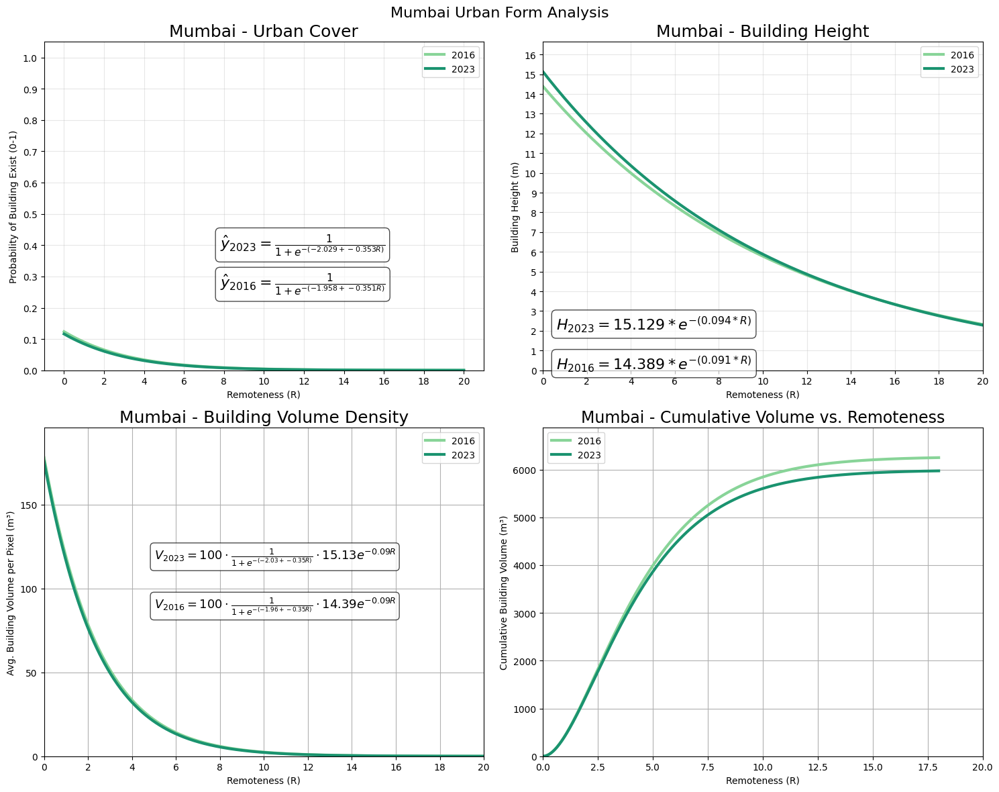

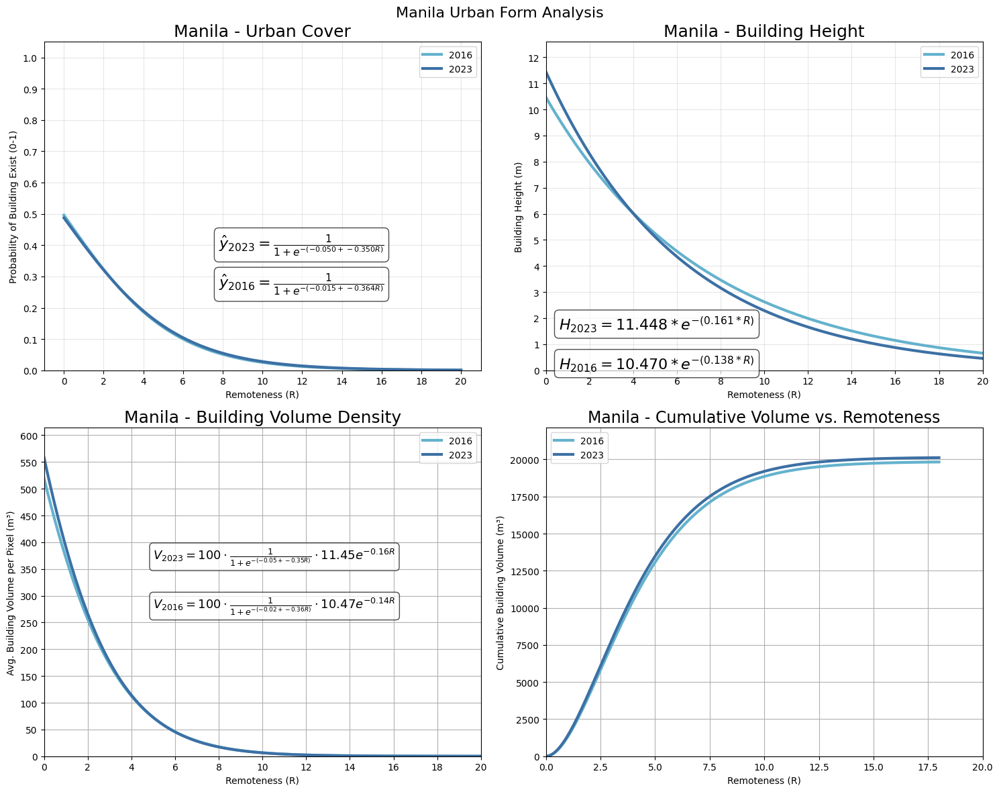

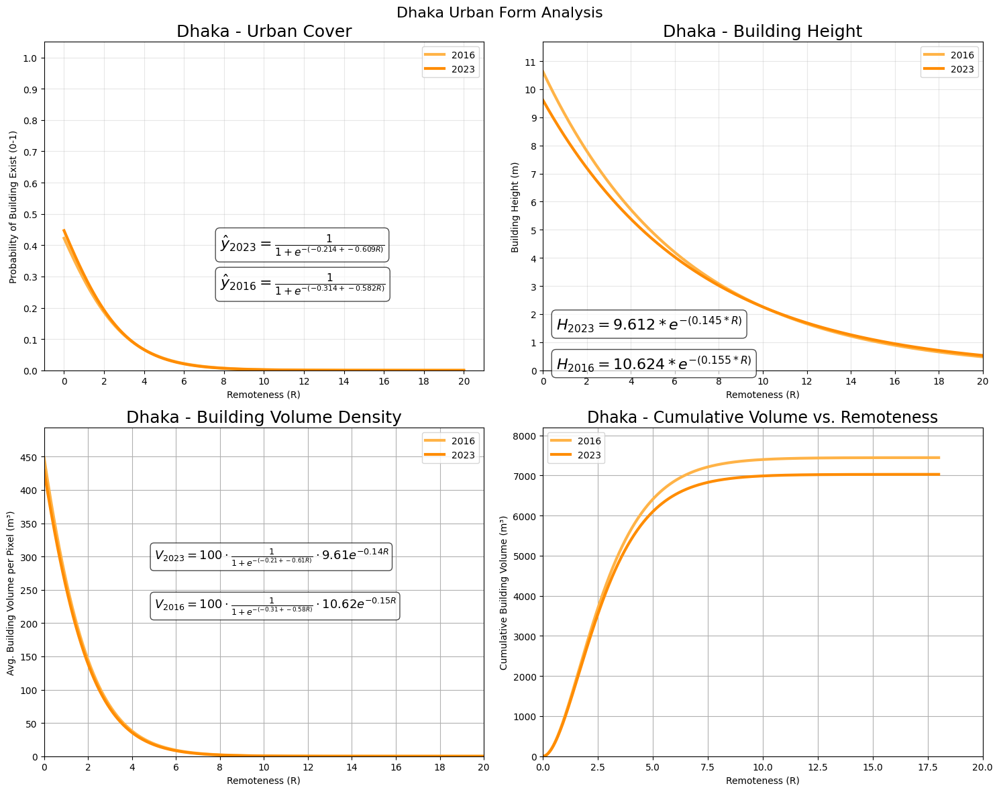

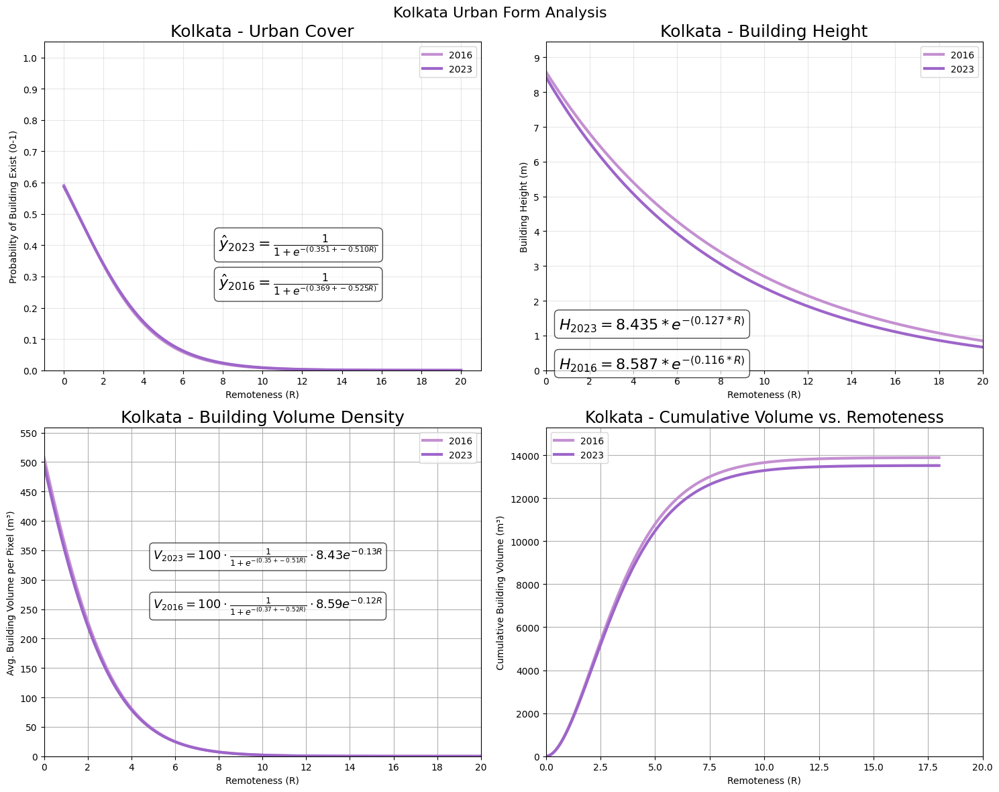

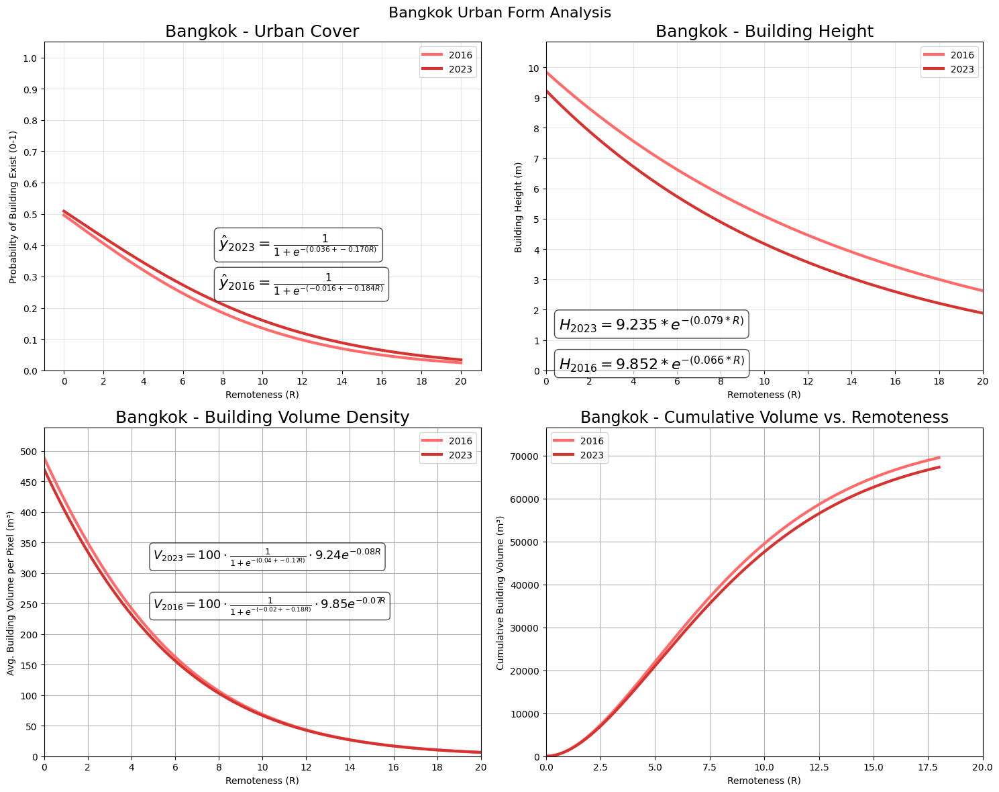

...

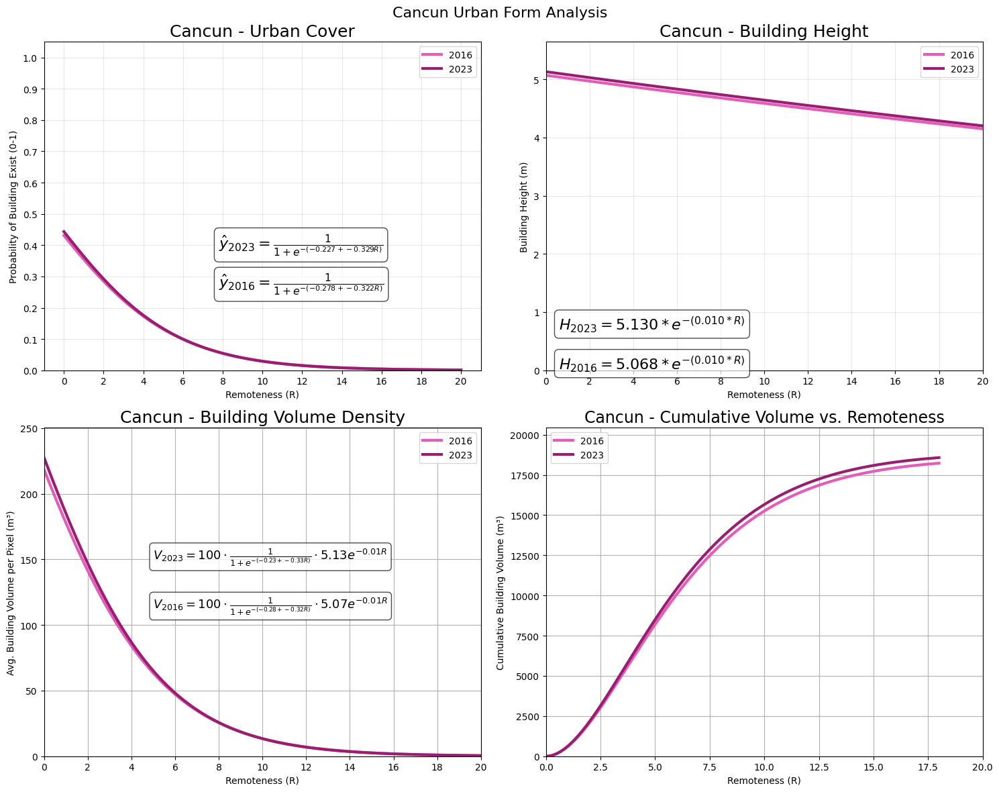

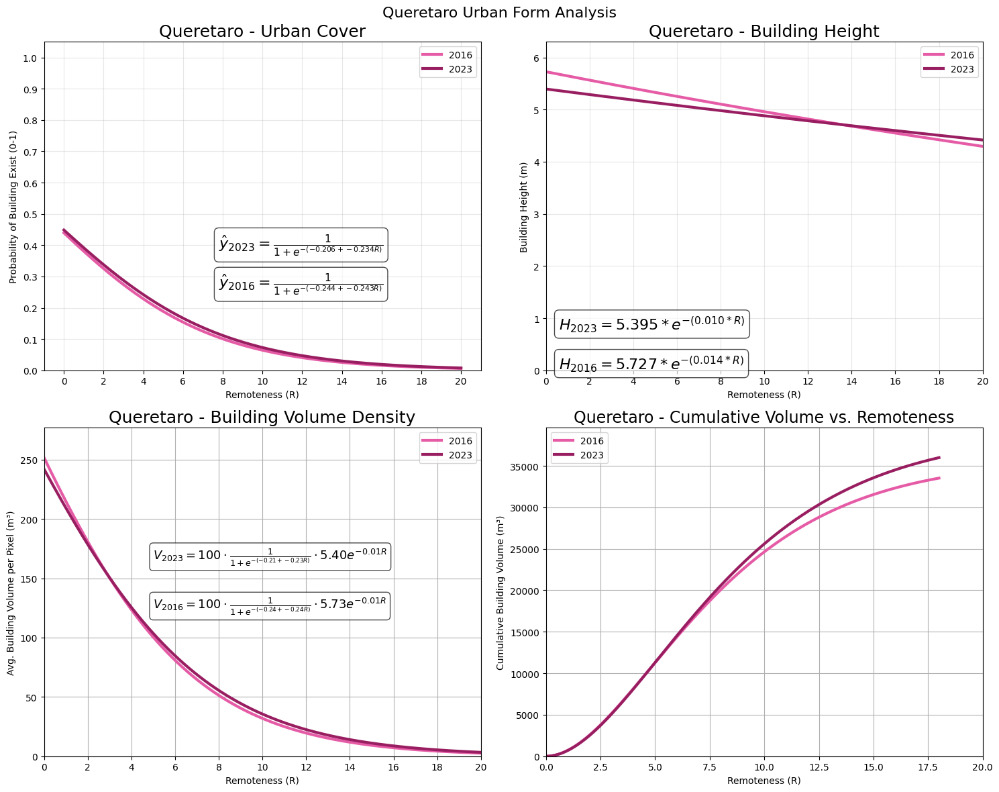

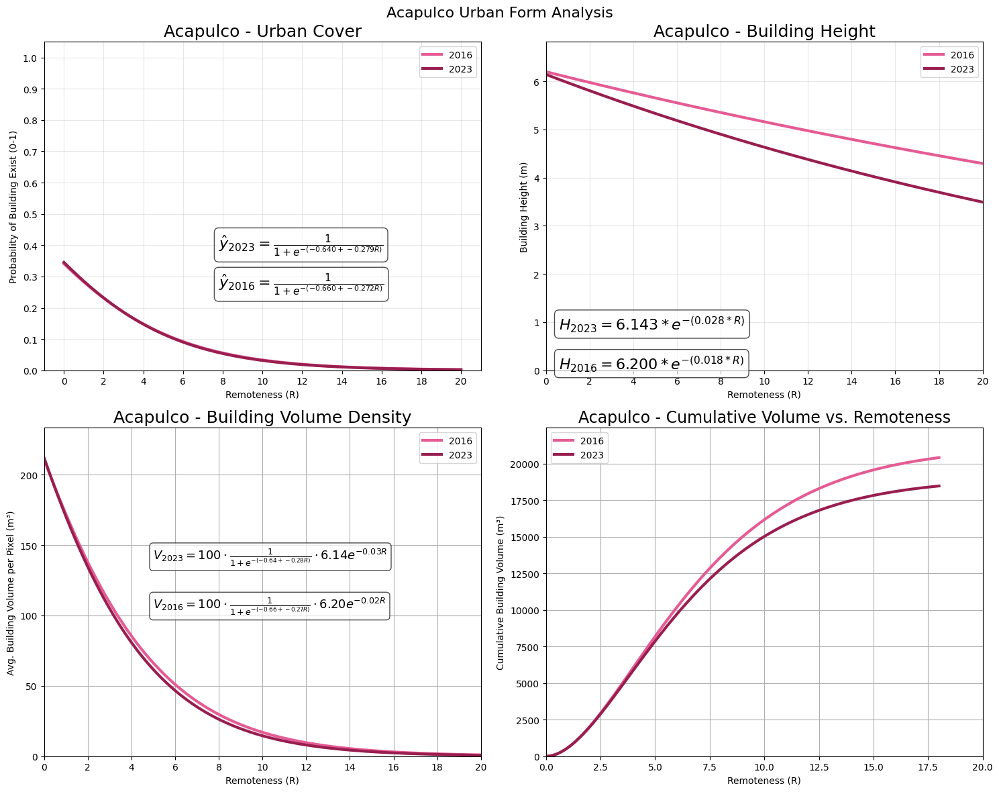

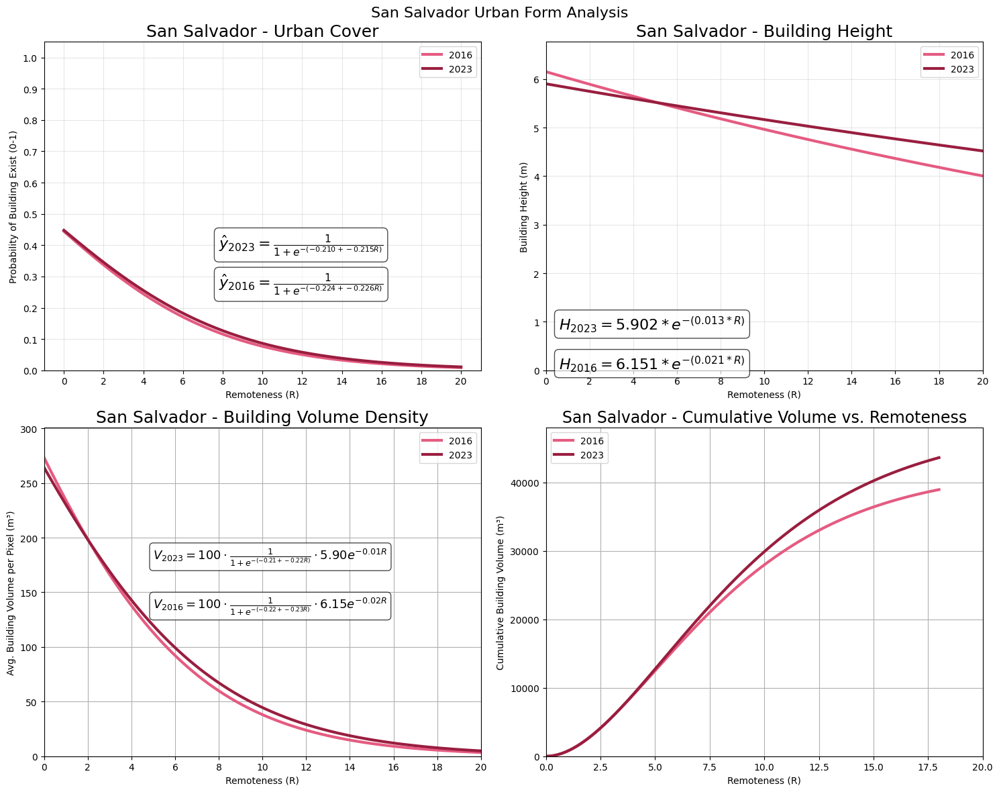

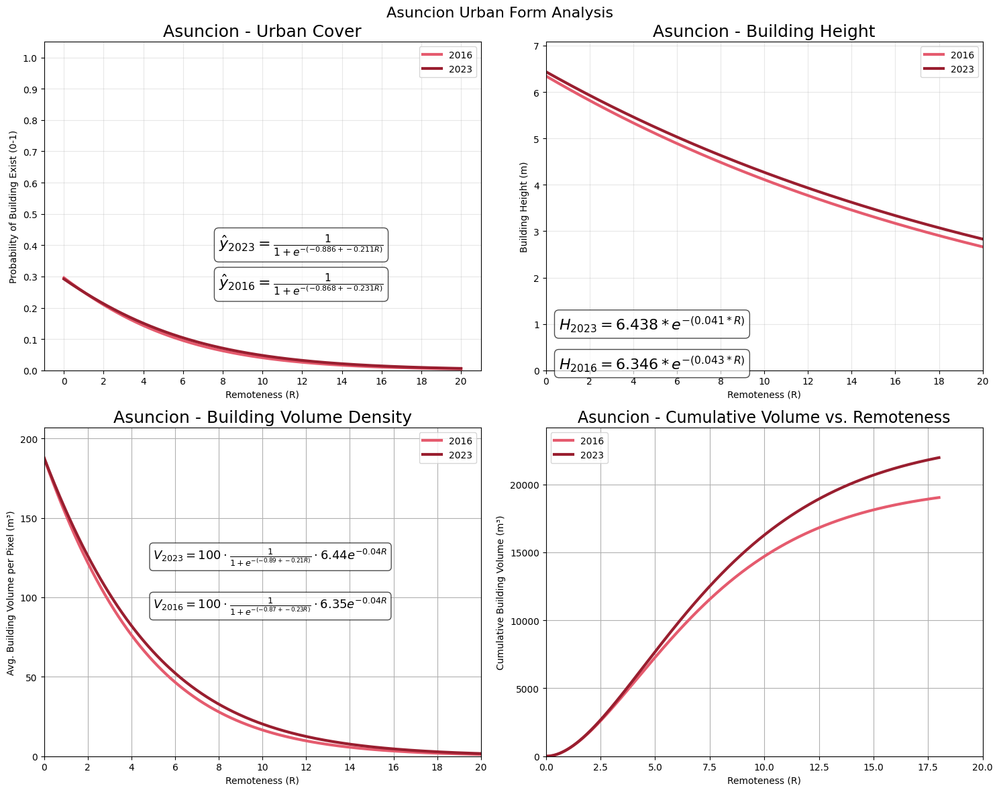

In [5]:
# Example usage
if __name__ == "__main__":    
    # Run the analysis with all visualizations
    run_urban_form_analysis(
        cities_data=cities_data,
        visualizations=['individual'],
        #visualizations=['combined'],
        data_folder="pixel_data",
        save_path="visualizations",
        create_samples=True # 第一次运行时设为True，之后可以设为False
    )